In [2]:
import os
import anndata
import pandas as pd
import numpy as np
import scanpy as sc
from skimage.io import imread

import matplotlib.pyplot as plt
import seaborn as sns
import ot

import scipy.sparse
from scipy.sparse import coo_matrix, csr_matrix
from pyensembl import EnsemblRelease

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
from scipy.special import softmax
from sklearn.metrics import silhouette_score
from sklearn import metrics

import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GAE
from torch_geometric.data import Data
from torch_geometric.utils import from_scipy_sparse_matrix

import time
from tqdm import tqdm

2024-12-17 11:03:49.646379: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-17 11:03:49.694261: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/torch_geometric/typing.py:54: UserWarning: An issue occurred while importing 'pyg-lib'. Disabling its usage. Stacktrace: /lib64/libm.so.6: version `GLIBC_2.27' not found (required by /export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/libpyg.so)
  warnings.w

In [4]:
from scoiget.preprocess_utils import generate_adata, preprocess_adata, quality_control, plot_adata_visualizations
from scoiget.cnv_utils import add_genomic_locations, gene_binning_from_adata, perform_clustering, find_normal_cluster, compute_pseudo_copy
from scoiget.cnv_utils import perform_clustering_gpu, find_normal_cluster_gpu, auto_corr_gpu, kmeans_gpu, silhouette_score_gpu
from scoiget.graph_utils import get_x_bin_data, get_x_bin_data_torch, construct_spatial_knn_graph, compute_edge_weights_and_probabilities
from scoiget.scoiget_model import SCOIGET, Encoder, CNEncoder, Decoder
from scoiget.train_utils import prepare_data, train_scoiget
from scoiget.cluster_utils import clustering
from scoiget.segment_utils import split_data_by_cluster, perform_segmentation, plot_heatmap_and_segmentation
from scoiget.draw_utils import draw_spatial, draw_embedding, draw_umap, draw_paga

In [4]:
sample_root = './Dataset/PAT71397'
output_dir = './Dataset/PAT71397/merged_output'
cy_file_path = './Macosko_cell_cycle_genes.txt'

In [5]:
sample_ids = ['6723_1', '6723_2', '6723_3', '6723_4']
data_paths = [os.path.join(sample_root, '{}/6723_KL_{}_filtered_trimmed.h5ad'.format(sid, sid.split('_')[1])) for sid in sample_ids]
annotation_paths = [f"{sample_root}/{sid}/{sid}_pathology_annotation.csv" for sid in sample_ids]

adatas = []

for i, sid in enumerate(sample_ids):
    adata = sc.read_h5ad(data_paths[i])
    
    adata.obs['sample_id'] = sid
    
    pathology_df = pd.read_csv(annotation_paths[i])
    print(f"Columns in pathology_df for {sid}: {pathology_df.columns}")
    
    if 'Barcode' not in pathology_df.columns:
        raise KeyError(f"'Barcode' not found in pathology_df for sample {sid}. Available columns: {pathology_df.columns}")
    
    pathology_df.set_index('Barcode', inplace=True)
    adata.obs = adata.obs.merge(pathology_df, left_index=True, right_index=True, how='left')
    
    adata.obs.index = adata.obs.index.astype(str)
    
    adatas.append(adata)

Columns in pathology_df for 6723_1: Index(['Barcode', 'pathology_annotation'], dtype='object')
Columns in pathology_df for 6723_2: Index(['Barcode', 'pathology_annotation'], dtype='object')
Columns in pathology_df for 6723_3: Index(['Barcode', 'pathology_annotation'], dtype='object')
Columns in pathology_df for 6723_4: Index(['Barcode', 'pathology_annotation'], dtype='object')


#### Step1: Read data

In [6]:
adata = anndata.concat(
    adatas,
    join='inner', 
    label='sample_id',  
    keys=sample_ids,  
    merge='same',  
    pairwise=False  
)
print(adata)
print(f"Merged AnnData shape: {adata.shape}")

AnnData object with n_obs × n_vars = 15201 × 18729
    obs: 'in_tissue', 'array_row', 'array_col', 'sample_id', 'pathology_annotation'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'image_means', 'spatial', 'spatial_trim'
Merged AnnData shape: (15201, 18729)


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
import numpy as np
import os

adata.uns['spatial'] = {}

spatial_coordinates = []
total_obs_count = 0  

for i, ad in enumerate(adatas):
    library_id = sample_ids[i]  #

    if 'spatial' in ad.uns:
        sample_key = list(ad.uns['spatial'].keys())[0]
        spatial_data = ad.uns['spatial'][sample_key]
        
        if 'images' not in spatial_data or 'scalefactors' not in spatial_data:
            raise ValueError(f"Missing 'images' or 'scalefactors' in .uns['spatial'] for sample {sample_key}")
        
        adata.uns['spatial'][library_id] = spatial_data
    else:
        raise ValueError(f"No 'spatial' information found in .uns for sample {library_id}")

    if 'spatial' in ad.obsm:
        spatial_coordinates.append(ad.obsm['spatial'])
        total_obs_count += ad.n_obs
    else:
        raise ValueError(f"Missing 'spatial' in .obsm for sample {library_id}")

adata.obsm['spatial'] = np.vstack(spatial_coordinates)

if adata.obsm['spatial'].shape[0] != total_obs_count:
    raise ValueError(
        f"Mismatch in the number of spatial coordinates in .obsm['spatial'] after merging. "
        f"Expected {total_obs_count}, but got {adata.obsm['spatial'].shape[0]}."
)

print("Successfully merged .uns['spatial'] and .obsm['spatial']!")

Successfully merged .uns['spatial'] and .obsm['spatial']!


In [8]:
for key, value in adata.uns['spatial'].items():
    print(f"Sample: {key}, Keys in spatial data: {list(value.keys())}")

print(f"Shape of merged spatial coordinates: {adata.obsm['spatial'].shape}")
print(f"Total number of observations in adata: {adata.n_obs}")

Sample: 6723_1, Keys in spatial data: ['images', 'metadata', 'scalefactors']
Sample: 6723_2, Keys in spatial data: ['images', 'metadata', 'scalefactors']
Sample: 6723_3, Keys in spatial data: ['images', 'metadata', 'scalefactors']
Sample: 6723_4, Keys in spatial data: ['images', 'metadata', 'scalefactors']
Shape of merged spatial coordinates: (15201, 2)
Total number of observations in adata: 15201


... storing 'pathology_annotation' as categorical
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted a

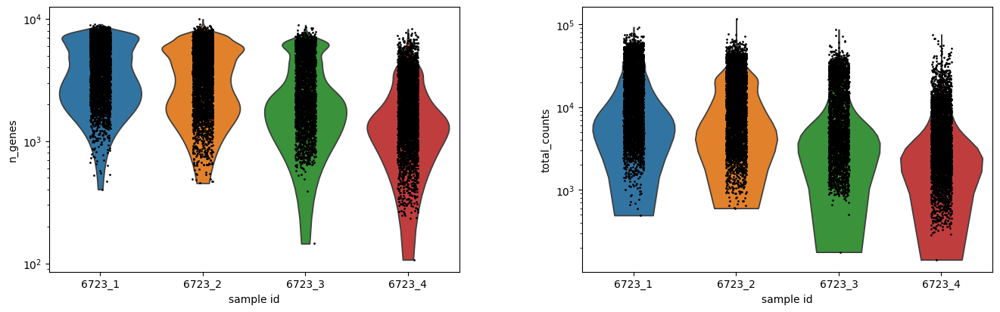

In [9]:
adata.obs['n_genes'] = (adata.X > 0).sum(axis=1)
adata.obs['total_counts'] = adata.X.sum(axis=1)

sc.pl.violin(adata, ['n_genes', 'total_counts'], groupby='sample_id', size=2, log=True)


#### Step2: Pre-process adata

In [10]:
# Step2: pre-process adata
# Process and filter data, Dimensionality reduction and clustering
print('----Pre-processing adata----')
adata = preprocess_adata(adata, cy_file_path)
print("Pre-processed adata with shape:", adata.shape)


----Pre-processing adata----
---Filtering spots with counts less than 20---
Filtered out 0 spots with counts < 20


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


---Filtering cell cycle genes---
Filtered out 522 cell cycle genes
---Filtering mitochondrial RNA (mtRNA) genes---
Filtered out 89 mitochondrial RNA (mtRNA) genes
---Filtering HLA genes---
Filtered out 20 HLA genes


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Pre-processed adata with shape: (15201, 18096)


In [11]:
# quality control
print('----Quality Control----')
quality_control(adata, output_dir)

----Quality Control----
Total observations (spots): 15201
Total variables (genes): 18096
Total counts: 107624823.7879307
Median counts per spot: 7367.444840509981
Median genes per spot: 3178.0


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


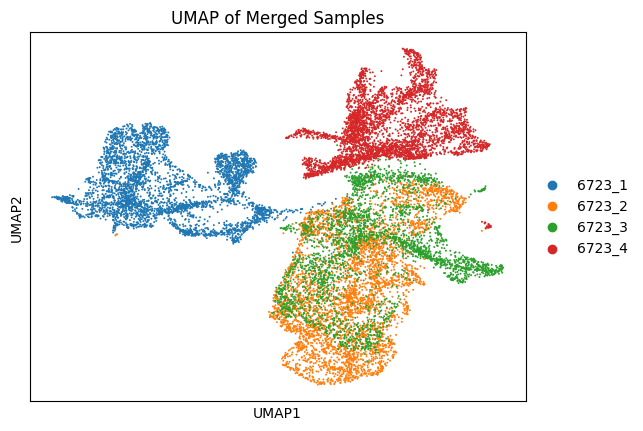

/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


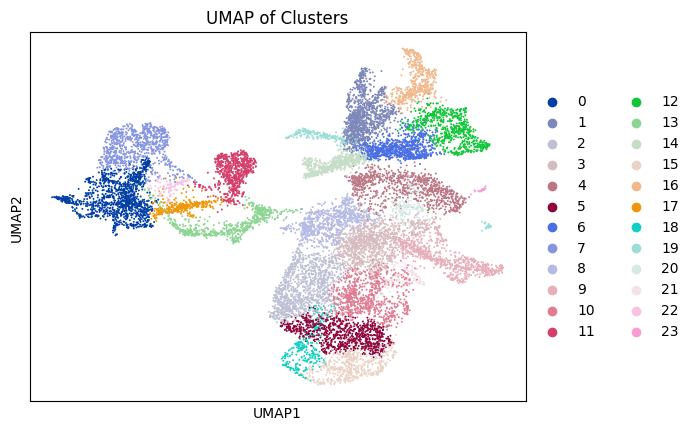

In [20]:
sc.pl.umap(
    adata,
    color=["sample_id"],  
    title="UMAP of Merged Samples",
)

sc.pl.umap(
    adata,
    color=["leiden"],  
    title="UMAP of Clusters"
)

In [15]:
# Harmony
import harmonypy as hm

ho = hm.run_harmony(adata.obsm['X_pca'], adata.obs, 'sample_id')
adata.obsm['X_pca_harmony'] = ho.Z_corr.T

sc.pp.neighbors(adata, use_rep='X_pca_harmony')
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=1.0)

2024-12-11 15:18:26,609 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...


2024-12-11 15:18:29,776 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-12-11 15:18:29,906 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2024-12-11 15:18:32,381 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2024-12-11 15:18:35,259 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


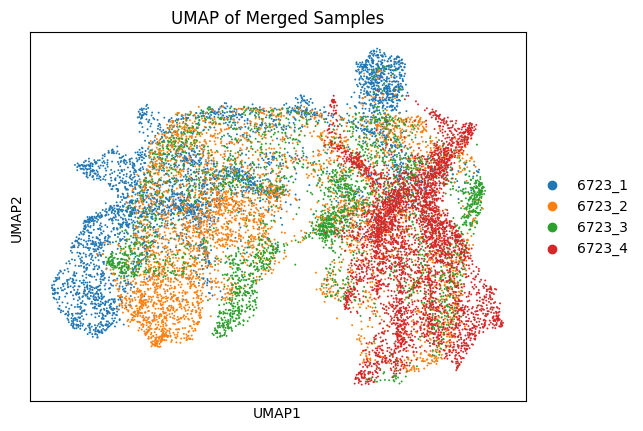

/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


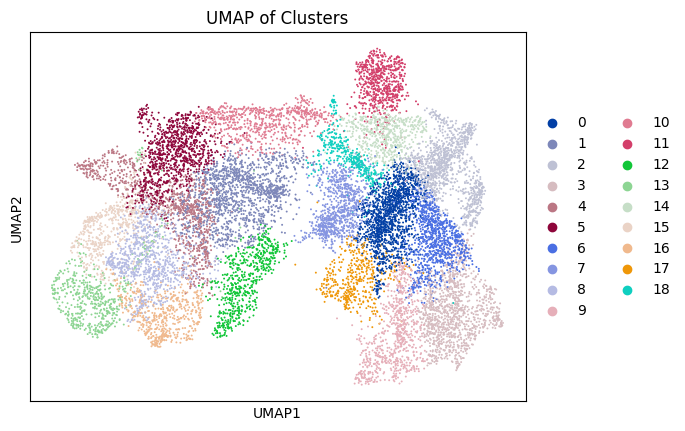

In [22]:
sc.pl.umap(
    adata,
    color=["sample_id"],  
    title="UMAP of Merged Samples",
)

sc.pl.umap(
    adata,
    color=["leiden"],  
    title="UMAP of Clusters"
)

#### Step3: Add genomic information

In [16]:
# Step3: add genomic information
# Add genomic location data to adata.var using pyensembl
print('----Add genomic location----')
add_genomic_locations(adata)
# bin genes from anndata with existing locations
print('----Gene binning from adata----')
adata, chrom_list = gene_binning_from_adata(adata, bin_size=10)
with open(os.path.join(output_dir, 'chrom_list.npy'), 'wb') as f:
    np.save(f, chrom_list)

print('----Finished preprocessing----')

----Add genomic location----
Removing 314 deprecated or invalid genes.


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Finished adding genomic locations with 0 errors.
----Gene binning from adata----


/export/home/zhangyujia/SCOIGET/scoiget/cnv_utils.py:82: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  adata_clean.var['chromosome'].cat.set_categories(
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


----Finished preprocessing----


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


#### Step4: Construct graph

In [17]:
# Step 4: Construct graph
# Get x_bin data and feature
print('----Get bin data and feature----')
adata = get_x_bin_data_torch(adata, bin_size=10)

adata_binned = adata.uns['binned_data']
X_bin = adata_binned.obsm['X_bin']
adata.obsm['feat'] = X_bin

# Construct spatial neighbor graph
print('----Construct spatial neighbor graph----')
construct_spatial_knn_graph(adata, n_neighbors=5)

if 'graph_neigh' not in adata.obsm:
    raise ValueError("graph_neigh not found in adata.obsm. Check `construct_spatial_knn_graph` function.")
else:
    print(f"Number of edges in `graph_neigh`: {adata.obsm['graph_neigh'].count_nonzero()}")

# Compute edge weights and probabilities
print('----Compute edge weights and probabilities----')
compute_edge_weights_and_probabilities(adata, use_norm_x=False)

edge_prob_key = 'edge_probabilities'
if edge_prob_key not in adata.obsm:
    raise ValueError(f"{edge_prob_key} not found in adata.obsm. Check `compute_edge_weights_and_probabilities` function.")
else:
    edge_count = adata.obsm[edge_prob_key].count_nonzero()
    graph_edge_count = adata.obsm['graph_neigh'].count_nonzero()
    print(f"Number of edges in `edge_probabilities`: {edge_count}")
    print(f"Number of edges in `graph_neigh`: {graph_edge_count}")
    if edge_count != graph_edge_count:
        raise ValueError("Mismatch between the number of edges in `edge_probabilities` and `graph_neigh`.")

----Get bin data and feature----
----Construct spatial neighbor graph----
Number of edges in `graph_neigh`: 86685
----Compute edge weights and probabilities----
Number of edges in `edge_probabilities`: 86685
Number of edges in `graph_neigh`: 86685


In [81]:
adata_path = os.path.join(sample_root, "combined_processed_adata.h5ad")

adata.write(adata_path)

In [5]:
import anndata as ad
sample_root = f'/export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/'
output_dir = '/export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output'
cy_file_path = '/export/home/zhangyujia/SCOIGET/Macosko_cell_cycle_genes.txt'

adata_path = os.path.join(sample_root, "combined_processed_adata.h5ad")

adata = ad.read_h5ad(adata_path)

/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


/tmp/ipykernel_15424/2221977472.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('viridis', len(unique_annotations))


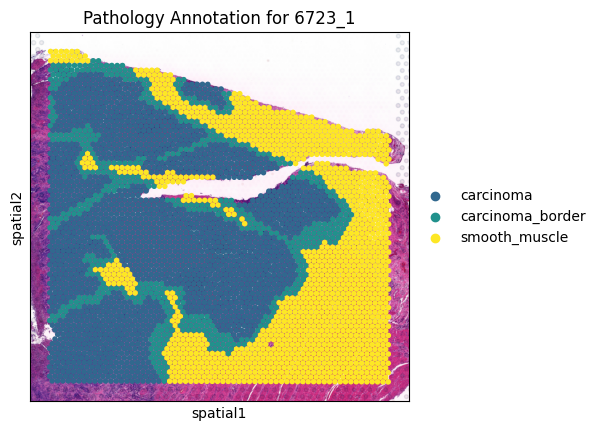

Saved pathology annotation for 6723_1 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/pathology_annotation_6723_1.png


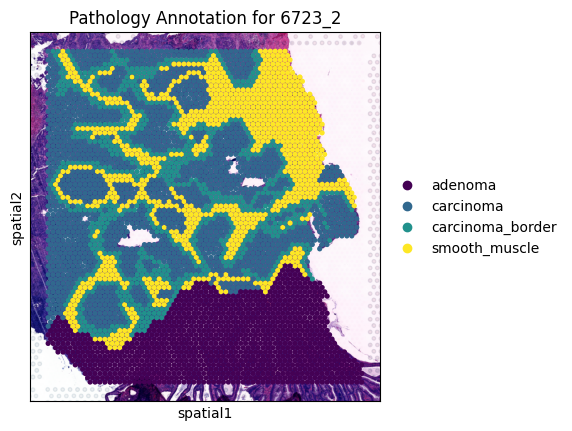

Saved pathology annotation for 6723_2 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/pathology_annotation_6723_2.png


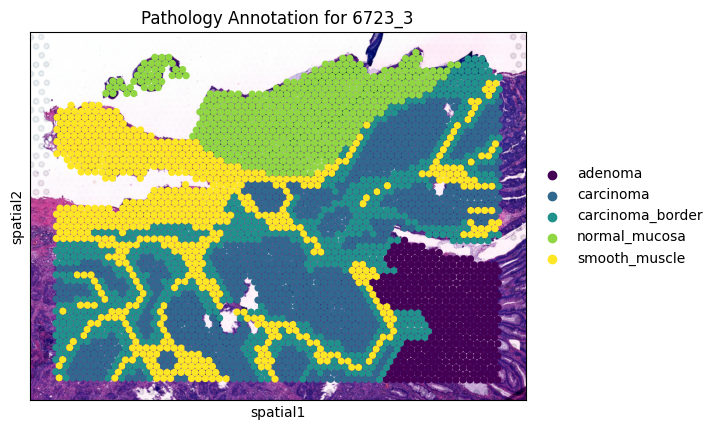

Saved pathology annotation for 6723_3 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/pathology_annotation_6723_3.png


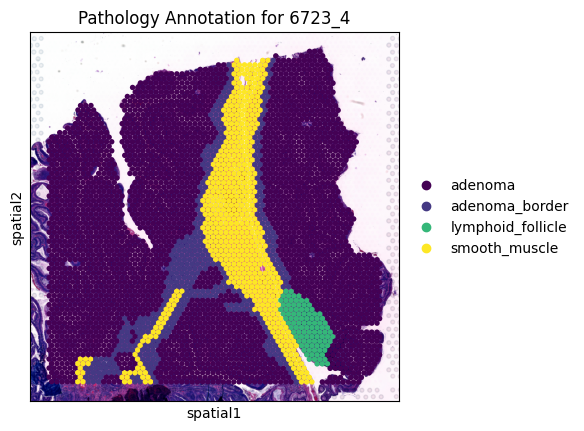

Saved pathology annotation for 6723_4 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/pathology_annotation_6723_4.png


In [30]:
import os
import matplotlib.pyplot as plt
import scanpy as sc
import matplotlib.colors as mcolors

unique_annotations = adata.obs['pathology_annotation'].unique()

from matplotlib.cm import get_cmap

cmap = get_cmap('viridis', len(unique_annotations))  
annotation_colors = {annotation: mcolors.to_hex(cmap(i)) for i, annotation in enumerate(unique_annotations)}

adata.uns['pathology_annotation_colors'] = [annotation_colors[annotation] for annotation in unique_annotations]

for library_id in adata.uns['spatial'].keys():
    adata_subset = adata[adata.obs['sample_id'] == library_id]
    if adata_subset.n_obs == 0:
        print(f"No data points for library_id: {library_id}")
        continue

    sc.pl.spatial(
        adata_subset,
        img_key='hires', 
        color='pathology_annotation',  
        size=1.6,
        library_id=library_id,
        title=f"Pathology Annotation for {library_id}"
    )

    output_file = os.path.join(output_dir, f"pathology_annotation_{library_id}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')  
    plt.close()  

    print(f"Saved pathology annotation for {library_id} to {output_file}")

#### Step5: Train GNN model

In [6]:
# Step5: Train GNN model
print('----Train GNN model----')
# prepare data
data = prepare_data(adata, use_norm_x=False)

----Train GNN model----
x shape: torch.Size([15201, 1769])
edge_index shape: torch.Size([2, 86685])
edge_attr shape: torch.Size([86685])


Training with feat...
Using device: cuda
Using full-graph training...


Training Progress:   3%|▎         | 1/35 [00:03<02:05,  3.68s/epoch, Training Loss=10.8]

Converged at iteration 2


Training Progress:   6%|▌         | 2/35 [00:42<13:22, 24.33s/epoch, Training Loss=9.46]

Converged at iteration 16


Training Progress:   9%|▊         | 3/35 [00:51<09:13, 17.31s/epoch, Training Loss=7.55]

Converged at iteration 7


Training Progress:  11%|█▏        | 4/35 [00:53<05:45, 11.15s/epoch, Training Loss=6.52]

Converged at iteration 3


Training Progress:  14%|█▍        | 5/35 [01:00<04:51,  9.73s/epoch, Training Loss=5.64]

Converged at iteration 2


Training Progress:  17%|█▋        | 6/35 [01:08<04:26,  9.21s/epoch, Training Loss=4.88]

Converged at iteration 6


Training Progress:  20%|██        | 7/35 [01:27<05:43, 12.27s/epoch, Training Loss=4.3] 

Converged at iteration 9


Training Progress:  23%|██▎       | 8/35 [01:55<07:50, 17.42s/epoch, Training Loss=3.79]

Converged at iteration 15


Training Progress:  26%|██▌       | 9/35 [02:05<06:30, 15.04s/epoch, Training Loss=3.28]

Converged at iteration 3


Training Progress:  29%|██▊       | 10/35 [02:26<07:00, 16.81s/epoch, Training Loss=2.8]

Converged at iteration 12
Epoch 10/35 - Training Loss: 2.7993


Training Progress:  31%|███▏      | 11/35 [02:31<05:19, 13.33s/epoch, Training Loss=2.39]

Converged at iteration 1


Training Progress:  34%|███▍      | 12/35 [02:45<05:11, 13.53s/epoch, Training Loss=2.06]

Converged at iteration 5


Training Progress:  37%|███▋      | 13/35 [02:58<04:55, 13.44s/epoch, Training Loss=1.77]

Converged at iteration 6


Training Progress:  43%|████▎     | 15/35 [04:36<10:13, 30.69s/epoch, Training Loss=1.33]

Converged at iteration 11


Training Progress:  46%|████▌     | 16/35 [04:53<08:26, 26.67s/epoch, Training Loss=1.17]

Converged at iteration 4


Training Progress:  49%|████▊     | 17/35 [05:08<06:58, 23.25s/epoch, Training Loss=1.03]

Converged at iteration 4


Training Progress:  51%|█████▏    | 18/35 [05:16<05:15, 18.55s/epoch, Training Loss=0.924]

Converged at iteration 3


Training Progress:  54%|█████▍    | 19/35 [05:39<05:16, 19.80s/epoch, Training Loss=0.841]

Converged at iteration 7


Training Progress:  57%|█████▋    | 20/35 [06:23<06:47, 27.17s/epoch, Training Loss=0.77] 

Epoch 20/35 - Training Loss: 0.7698


Training Progress:  60%|██████    | 21/35 [06:48<06:11, 26.57s/epoch, Training Loss=0.708]

Converged at iteration 11


Training Progress:  63%|██████▎   | 22/35 [07:08<05:18, 24.51s/epoch, Training Loss=0.656]

Converged at iteration 9


Training Progress:  66%|██████▌   | 23/35 [07:21<04:10, 20.91s/epoch, Training Loss=0.628]

Converged at iteration 5


Training Progress:  69%|██████▊   | 24/35 [07:27<03:03, 16.66s/epoch, Training Loss=0.604]

Converged at iteration 3


Training Progress:  71%|███████▏  | 25/35 [07:32<02:12, 13.23s/epoch, Training Loss=0.587]

Converged at iteration 5


Training Progress:  74%|███████▍  | 26/35 [07:39<01:41, 11.32s/epoch, Training Loss=0.576]

Converged at iteration 3


Training Progress:  80%|████████  | 28/35 [09:10<03:08, 27.00s/epoch, Training Loss=0.555]

Converged at iteration 11


Training Progress:  83%|████████▎ | 29/35 [09:38<02:44, 27.37s/epoch, Training Loss=0.541]

Converged at iteration 7


Training Progress:  86%|████████▌ | 30/35 [10:05<02:16, 27.30s/epoch, Training Loss=0.525]

Converged at iteration 14
Epoch 30/35 - Training Loss: 0.5248


Training Progress:  89%|████████▊ | 31/35 [10:41<02:00, 30.09s/epoch, Training Loss=0.509]

Converged at iteration 13


Training Progress:  97%|█████████▋| 34/35 [12:37<00:34, 34.87s/epoch, Training Loss=0.464]

Converged at iteration 10


Training Progress: 100%|██████████| 35/35 [13:13<00:00, 22.68s/epoch, Training Loss=0.451]

Converged at iteration 11
Model saved to output_dir/scoiget_model.pth


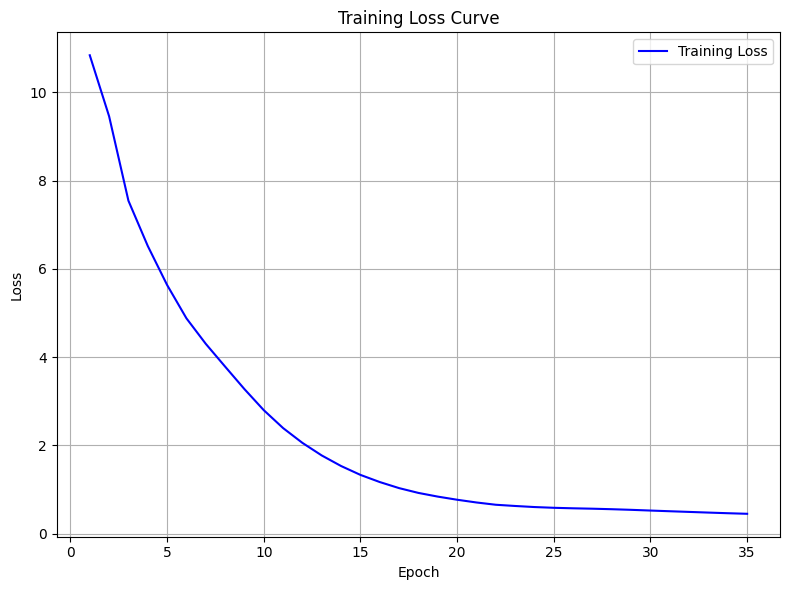

In [29]:
import numpy as np
# train GNN model
print("Training with feat...")
# 训练模型，无验证集
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_no_val = train_scoiget(
    data,
    original_dim=data.x.shape[1],
    intermediate_dim=128, 
    latent_dim=32, 
    max_cp=15, 
    kl_weights=0.1, 
    epochs=35, 
    lr=0.001, 
    lambda_smooth=0.1,
    use_mini_batch=False,  # 使用mini-batch模式
    #batch_size=1024, 
    #num_subgraphs=10,
    dropout=0.2, 
    hmm_states=3, 
    gnn_heads=8,
    device=device,
    save_path="output_dir"
)

In [9]:
model_path = os.path.join(output_dir, "model_1st.pth")
torch.save(model_no_val.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/model_1st.pth


In [30]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data.x = data.x.to(device)
data.edge_index = data.edge_index.to(device)
data.edge_attr = data.edge_attr.to(device)
model_no_val = model_no_val.to(device)

# pseudo copy number
print('----Compute copy number profile----')
with torch.no_grad():
    z_mean, z_var, latent_z = model_no_val.z_encoder(data.x, data.edge_index)
print("latent features:", latent_z)
adata.obsm['latent_z'] = latent_z

latent_z = latent_z.to(device)
with torch.no_grad():
    reconstructed_features = model_no_val.decoder(latent_z)
print("reconstructed features:", reconstructed_features)

#reconstructed_features = reconstructed_features.to(device)
pseudo_copy_number, _ = model_no_val.encoder([data.x, reconstructed_features], data.edge_index)

reconstructed_features = reconstructed_features.detach().cpu().numpy()
pseudo_copy_number = pseudo_copy_number.detach().cpu().numpy()
adata.obsm['norm_x'] = pseudo_copy_number
print("Pseudo copy number:", pseudo_copy_number)

----Compute copy number profile----
latent features: tensor([[-0.0162,  0.0663,  0.0129,  ...,  0.0558,  0.0816,  0.0781],
        [-0.0073,  0.0239,  0.0058,  ...,  0.0272,  0.0366,  0.0427],
        [-0.0180,  0.0661,  0.0041,  ...,  0.0655,  0.0784,  0.0677],
        ...,
        [-0.0062,  0.0617,  0.0012,  ...,  0.0569,  0.0709,  0.0696],
        [-0.0062,  0.0694,  0.0122,  ...,  0.0616,  0.0776,  0.0811],
        [-0.0094,  0.0632,  0.0098,  ...,  0.0566,  0.0702,  0.0781]],
       device='cuda:0')
reconstructed features: tensor([[-7.6805e-03, -8.4628e-03, -4.1308e-05,  ...,  2.1048e-04,
         -7.0863e-03,  4.3741e-03],
        [ 1.4564e-03, -1.0348e-02,  5.2679e-03,  ..., -3.8354e-04,
          2.3027e-02, -7.2560e-03],
        [-5.2398e-03, -8.7275e-03,  2.6119e-03,  ..., -2.0066e-03,
         -3.5352e-03,  3.8530e-04],
        ...,
        [-5.0129e-03, -7.2919e-03,  3.0684e-03,  ..., -1.8610e-03,
          1.1182e-03, -7.7277e-04],
        [-8.2692e-03, -8.7187e-03,  7.33

In [25]:
scaling_factor = pseudo_copy_number.mean()

pseudo_copy_number_scaled = pseudo_copy_number / scaling_factor

overall_mean = pseudo_copy_number_scaled.mean()
overall_std = pseudo_copy_number_scaled.std()
min_val = pseudo_copy_number_scaled.min()
max_val = pseudo_copy_number_scaled.max()

print(f"Scaling Factor: {scaling_factor:.4f}")
print(f"Mean: {overall_mean:.4f}, Std Dev: {overall_std:.4f}, Min: {min_val:.4f}, Max: {max_val:.4f}")

adata.obsm['norm_x'] = pseudo_copy_number_scaled

Scaling Factor: 0.3990
Mean: 1.0000, Std Dev: 0.4325, Min: -4.3879, Max: 5.6870


In [33]:
for key in adata.obsm.keys():
    if isinstance(adata.obsm[key], torch.Tensor):
        adata.obsm[key] = adata.obsm[key].detach().cpu().numpy()

for layer_name in adata.layers.keys():
    if isinstance(adata.layers[layer_name], torch.Tensor):
        adata.layers[layer_name] = adata.layers[layer_name].detach().cpu().numpy()

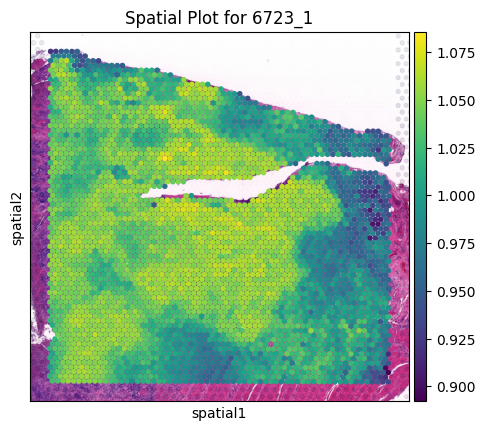

Saved spatial plot for 6723_1 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_pesudo_cnv_score_6723_1.png


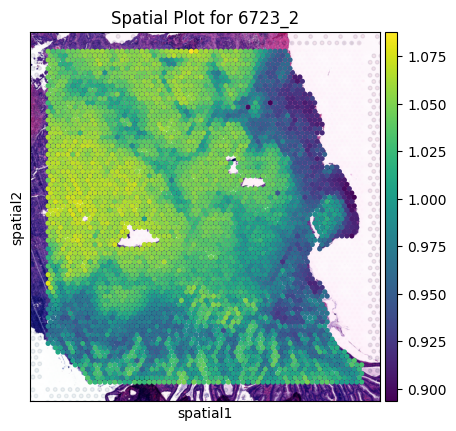

Saved spatial plot for 6723_2 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_pesudo_cnv_score_6723_2.png


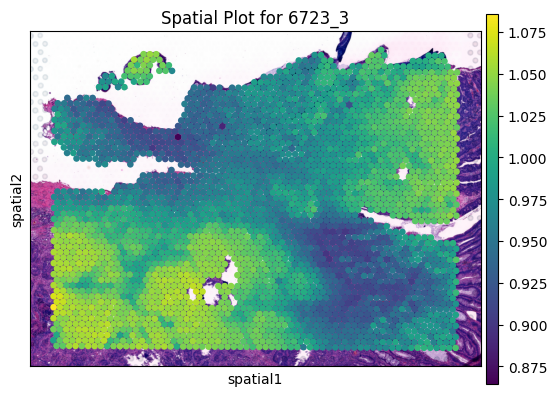

Saved spatial plot for 6723_3 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_pesudo_cnv_score_6723_3.png


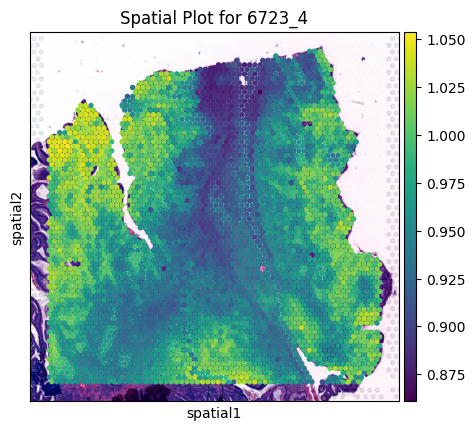

Saved spatial plot for 6723_4 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_pesudo_cnv_score_6723_4.png


In [31]:
### pseudo_copy_number
adata.obsm['pseudo_copy_number'] = pseudo_copy_number
adata.obs['pseudo_copy_number'] = pseudo_copy_number.mean(axis=1)

for library_id in adata.uns['spatial'].keys():
    adata_subset = adata[adata.obs['sample_id'] == library_id]

    if adata_subset.n_obs == 0:
        print(f"No data points for library_id: {library_id}")
        continue

    sc.pl.spatial(
        adata_subset,
        img_key='hires',  
        color='pseudo_copy_number',  
        size=1.6,
        library_id=library_id,
        title=f"Spatial Plot for {library_id}"
    )

    output_file = os.path.join(output_dir, f"spatial_pesudo_cnv_score_{library_id}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight')  
    plt.close() 

    print(f"Saved spatial plot for {library_id} to {output_file}")

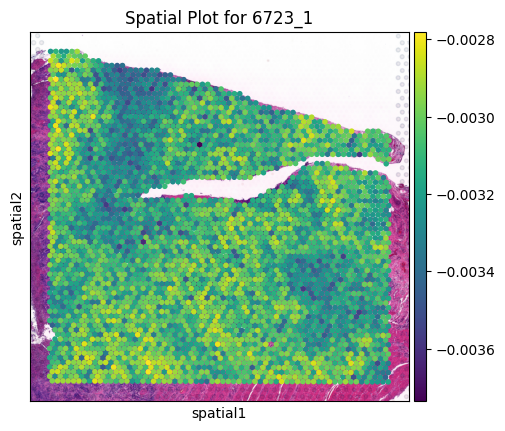

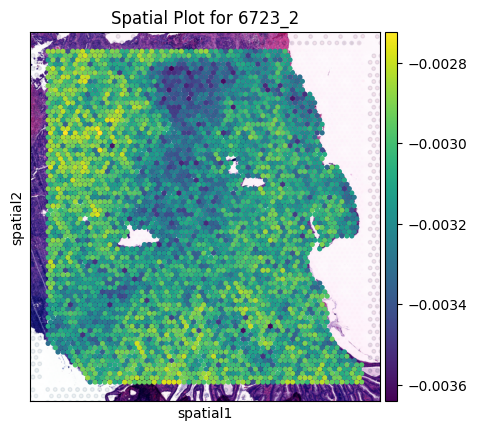

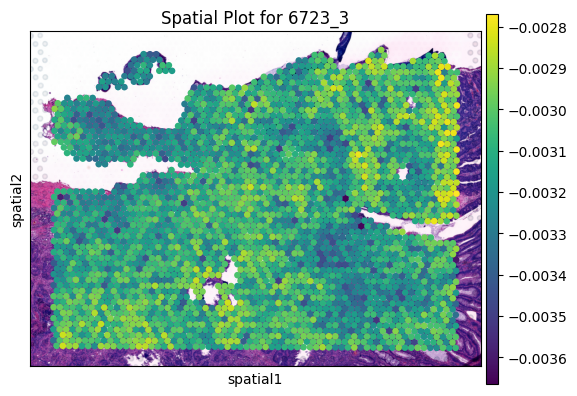

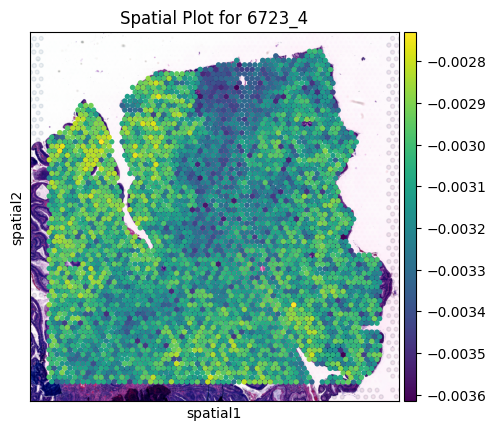

In [36]:
### reconstructed_features
adata.obs['reconstructed_features'] = reconstructed_features.mean(axis=1)

for library_id in adata.uns['spatial'].keys():
    adata_subset = adata[adata.obs['sample_id'] == library_id]
    sc.pl.spatial(
        adata_subset,
        img_key='hires', 
        color='reconstructed_features', 
        size=1.6,
        library_id=library_id,
        title=f"Spatial Plot for {library_id}"
    )
    plt.close()  


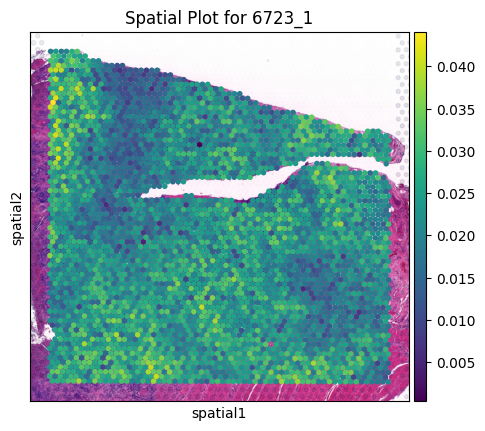

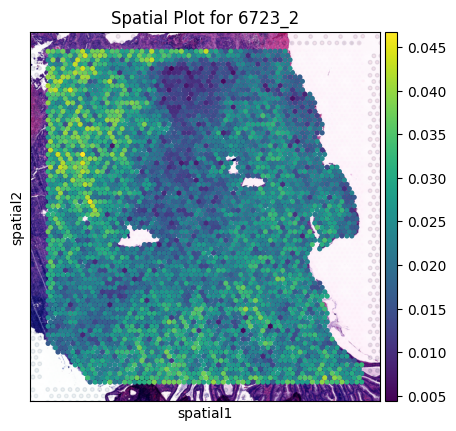

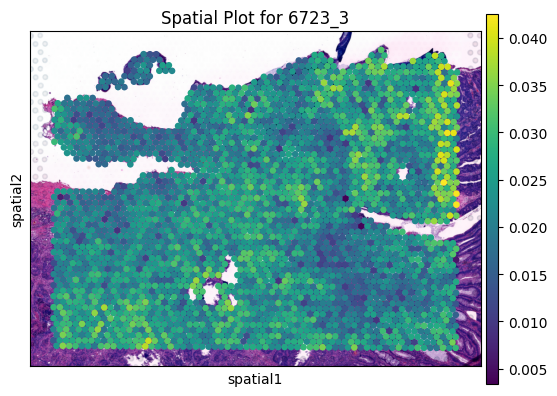

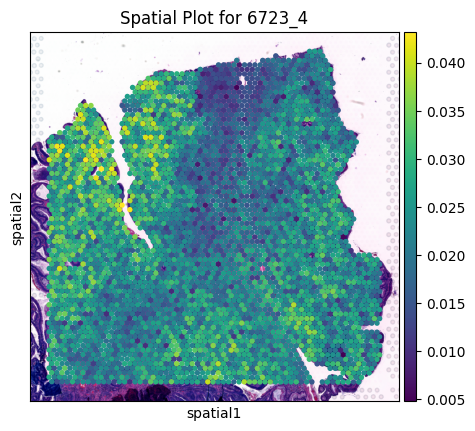

In [39]:
### latent_z
adata.obs['latent_z'] = adata.obsm['latent_z'].cpu().mean(axis=1)

for library_id in adata.uns['spatial'].keys():
    adata_subset = adata[adata.obs['sample_id'] == library_id]
    sc.pl.spatial(
        adata_subset,
        img_key='hires', 
        color='latent_z', 
        size=1.6,
        library_id=library_id,
        title=f"Spatial Plot for {library_id}"
    )
    plt.close()  

Sample 6723_1: Best Resolution = 0.4, Best ARI = 0.1486, Best NMI = 0.1714


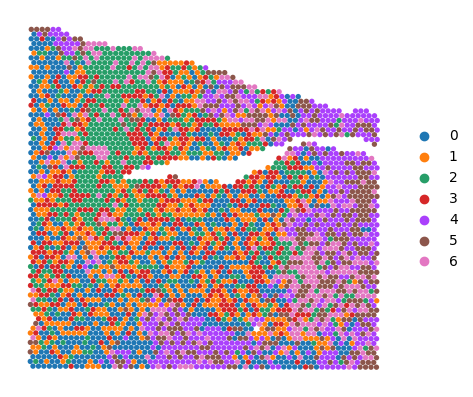

Sample 6723_2: Best Resolution = 0.30000000000000004, Best ARI = 0.0438, Best NMI = 0.0601


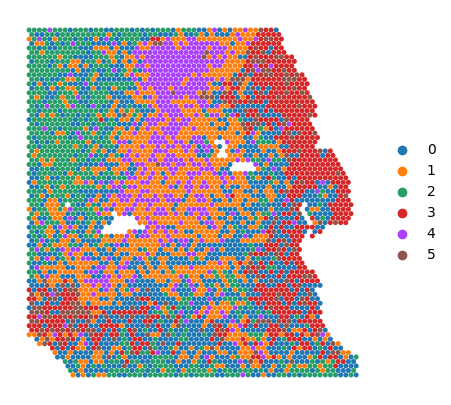

Sample 6723_3: Best Resolution = 0.1, Best ARI = 0.0567, Best NMI = 0.0522


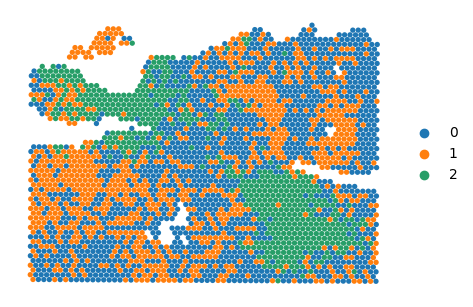

Sample 6723_4: Best Resolution = 0.1, Best ARI = 0.1309, Best NMI = 0.1376


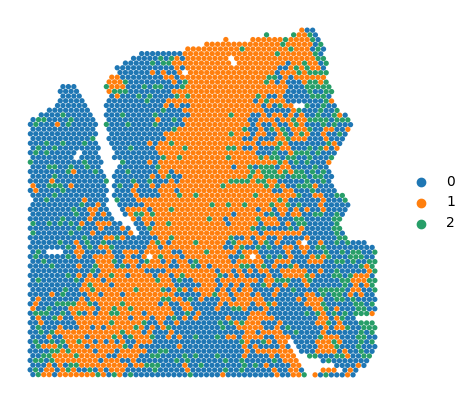


Best Resolutions for Each Sample: {'6723_1': 0.4, '6723_2': 0.30000000000000004, '6723_3': 0.1, '6723_4': 0.1}
Overall ARI Scores: {'6723_1': 0.1485761169618199, '6723_2': 0.043814262974038315, '6723_3': 0.056718530900928724, '6723_4': 0.13094508612579242}
Overall NMI Scores: {'6723_1': 0.17140349252109222, '6723_2': 0.060110097150166325, '6723_3': 0.05224502350725789, '6723_4': 0.13761679007927674}


In [43]:
import numpy as np
from sklearn import metrics
import scanpy as sc
import matplotlib.pyplot as plt

use_rep = "pseudo_copy_number"  # 'latent', 'copy_number', 'X_pca'
method = 'leiden'  #  'mclust', 'leiden', 'louvain'
resolutions = np.arange(0.1, 1.1, 0.1)  

samples = adata.obs['sample_id'].unique() 
best_resolutions = {}
overall_ari_scores = {}
overall_nmi_scores = {}

if isinstance(adata.X, torch.Tensor):
    adata.X = adata.X.cpu().numpy()
for key, value in adata.obsm.items():
    if isinstance(value, torch.Tensor):
        adata.obsm[key] = value.cpu().numpy()

for sample in samples:
    subset = adata[adata.obs['sample_id'] == sample]
    best_resolution = None
    best_ari = -1  
    best_nmi = -1  
    metrics_per_res = {}

    for res in resolutions:
        sc.pp.neighbors(subset, use_rep=use_rep, n_neighbors=15, metric="euclidean")
        sc.tl.leiden(subset, resolution=res)

        # ARI NMI
        if 'pathology_annotation' in subset.obs:
            ari = metrics.adjusted_rand_score(subset.obs['leiden'], subset.obs['pathology_annotation'])
            nmi = metrics.normalized_mutual_info_score(subset.obs['leiden'], subset.obs['pathology_annotation'])
            metrics_per_res[res] = {'ARI': ari, 'NMI': nmi}

            if ari > best_ari:
                best_ari = ari
                best_nmi = nmi
                best_resolution = res

    best_resolutions[sample] = best_resolution
    overall_ari_scores[sample] = best_ari
    overall_nmi_scores[sample] = best_nmi
    print(f"Sample {sample}: Best Resolution = {best_resolution}, Best ARI = {best_ari:.4f}, Best NMI = {best_nmi:.4f}")

    if best_resolution is not None:
        sc.pp.neighbors(subset, use_rep=use_rep, n_neighbors=15, metric="euclidean")
        sc.tl.leiden(subset, resolution=best_resolution)

        fig, ax = plt.subplots(figsize=(5, 5))
        sc.pl.spatial(
            subset,
            img_key=None, 
            color="leiden",  
            library_id=sample,  # 明确指定 library_id
            size=1.5,
            title="",
            ax=ax,  # 自定义图形对象
            show=False  # 延迟显示
        )
        ax.axis('off')  # 去掉边框
        plt.show()  # 显示图像

# 输出结果
print("\nBest Resolutions for Each Sample:", best_resolutions)
print("Overall ARI Scores:", overall_ari_scores)
print("Overall NMI Scores:", overall_nmi_scores)

#### Step7: Train model again and get copy number profile

In [41]:
# Step7: Train model again and get copy number profile
# compute edge and prepare data
compute_edge_weights_and_probabilities(adata, use_norm_x=True)
print('----Finished constructing graph----')

data_norm = prepare_data(adata, use_norm_x=True)

----Finished constructing graph----
x shape: torch.Size([15201, 1769])
edge_index shape: torch.Size([2, 86685])
edge_attr shape: torch.Size([86685])


Training with norm_x and val...
Using device: cuda
Using full-graph training...


Training Progress:   3%|▎         | 1/35 [00:04<02:37,  4.65s/epoch, Training Loss=14.1, Validation Loss=4.19]

Converged at iteration 5
Converged at iteration 17


Training Progress:   6%|▌         | 2/35 [00:40<12:43, 23.13s/epoch, Training Loss=16.1, Validation Loss=3.1] 

Converged at iteration 13


Training Progress:   9%|▊         | 3/35 [01:54<24:46, 46.46s/epoch, Training Loss=10.7, Validation Loss=2.8]

Converged at iteration 7
Converged at iteration 16


Training Progress:  11%|█▏        | 4/35 [02:26<20:59, 40.62s/epoch, Training Loss=9.32, Validation Loss=2.47]

Converged at iteration 10


Training Progress:  14%|█▍        | 5/35 [03:12<21:18, 42.61s/epoch, Training Loss=7.69, Validation Loss=2.23]

Converged at iteration 13


Converged at iteration 5


Training Progress:  17%|█▋        | 6/35 [03:21<15:05, 31.22s/epoch, Training Loss=6.51, Validation Loss=2.06]

Converged at iteration 12
Converged at iteration 14


Training Progress:  29%|██▊       | 10/35 [06:23<16:59, 40.77s/epoch, Training Loss=5.05, Validation Loss=1.82]

Epoch 10/35 - Training Loss: 5.0487, Validation Loss: 1.8154


Training Progress:  31%|███▏      | 11/35 [06:55<15:13, 38.08s/epoch, Training Loss=4.55, Validation Loss=1.73]

Converged at iteration 13


Converged at iteration 9


Training Progress:  34%|███▍      | 12/35 [07:05<11:17, 29.46s/epoch, Training Loss=4.14, Validation Loss=1.66]

Converged at iteration 13


Training Progress:  37%|███▋      | 13/35 [07:25<09:42, 26.46s/epoch, Training Loss=3.82, Validation Loss=1.6] 

Converged at iteration 17


Training Progress:  40%|████      | 14/35 [08:52<15:41, 44.83s/epoch, Training Loss=3.51, Validation Loss=1.54]

Converged at iteration 17


Training Progress:  43%|████▎     | 15/35 [10:17<18:59, 56.96s/epoch, Training Loss=3.24, Validation Loss=1.49]

Converged at iteration 3
Converged at iteration 7


Training Progress:  49%|████▊     | 17/35 [12:16<17:59, 59.98s/epoch, Training Loss=2.75, Validation Loss=1.4] 

Converged at iteration 9
Converged at iteration 9


Training Progress:  51%|█████▏    | 18/35 [12:52<14:55, 52.68s/epoch, Training Loss=2.55, Validation Loss=1.36]

Converged at iteration 3
Converged at iteration 14


Training Progress:  57%|█████▋    | 20/35 [15:35<17:12, 68.82s/epoch, Training Loss=2.19, Validation Loss=1.29]

Converged at iteration 5
Epoch 20/35 - Training Loss: 2.1918, Validation Loss: 1.2909


Training Progress:  60%|██████    | 21/35 [17:00<17:14, 73.87s/epoch, Training Loss=2.03, Validation Loss=1.26]

Converged at iteration 10
Converged at iteration 10


Training Progress:  63%|██████▎   | 22/35 [17:50<14:26, 66.64s/epoch, Training Loss=1.89, Validation Loss=1.24]

Converged at iteration 8
Converged at iteration 19


Training Progress:  66%|██████▌   | 23/35 [18:54<13:08, 65.71s/epoch, Training Loss=1.77, Validation Loss=1.22]

Converged at iteration 12
Converged at iteration 7


Training Progress:  69%|██████▊   | 24/35 [19:33<10:36, 57.85s/epoch, Training Loss=1.67, Validation Loss=1.2] 

Converged at iteration 3
Converged at iteration 15


Training Progress:  71%|███████▏  | 25/35 [20:14<08:47, 52.74s/epoch, Training Loss=1.58, Validation Loss=1.19]

Converged at iteration 5
Converged at iteration 8


Training Progress:  74%|███████▍  | 26/35 [20:44<06:52, 45.85s/epoch, Training Loss=1.51, Validation Loss=1.18]

Converged at iteration 4
Converged at iteration 12


Training Progress:  77%|███████▋  | 27/35 [21:23<05:50, 43.83s/epoch, Training Loss=1.46, Validation Loss=1.17]

Converged at iteration 5


Training Progress:  80%|████████  | 28/35 [22:21<05:35, 47.97s/epoch, Training Loss=1.41, Validation Loss=1.16]

Converged at iteration 4


Training Progress:  83%|████████▎ | 29/35 [23:55<06:12, 62.02s/epoch, Training Loss=1.37, Validation Loss=1.16]

Converged at iteration 10


Training Progress:  86%|████████▌ | 30/35 [24:29<04:27, 53.52s/epoch, Training Loss=1.34, Validation Loss=1.15]

Epoch 30/35 - Training Loss: 1.3444, Validation Loss: 1.1526


Training Progress:  89%|████████▊ | 31/35 [25:25<03:37, 54.25s/epoch, Training Loss=1.32, Validation Loss=1.15]

Converged at iteration 11


Training Progress:  91%|█████████▏| 32/35 [26:27<02:49, 56.43s/epoch, Training Loss=1.29, Validation Loss=1.15]

Converged at iteration 4


Training Progress:  94%|█████████▍| 33/35 [26:37<01:25, 42.58s/epoch, Training Loss=1.27, Validation Loss=1.15]

Converged at iteration 19
Converged at iteration 14


Training Progress:  97%|█████████▋| 34/35 [26:54<00:34, 34.94s/epoch, Training Loss=1.25, Validation Loss=1.14]

Converged at iteration 4


Training Progress: 100%|██████████| 35/35 [27:11<00:00, 46.60s/epoch, Training Loss=1.24, Validation Loss=1.14]


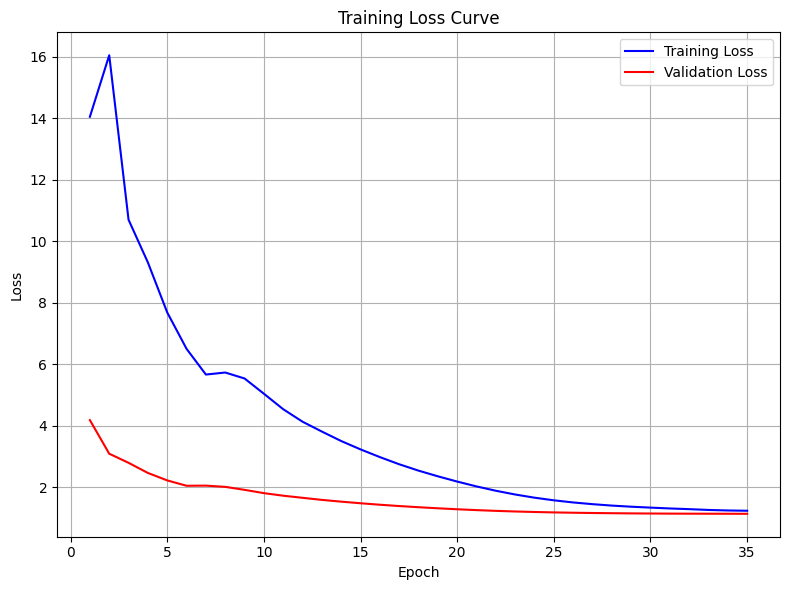

In [48]:
# train SCOIGET model
print("Training with norm_x and val...")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scoiget_model = train_scoiget(
    data_norm,
    original_dim=data_norm.x.shape[1],
    intermediate_dim=128, 
    latent_dim=32, 
    max_cp=15, 
    kl_weights=0.1, 
    epochs=35, 
    lr=0.001, 
    lambda_smooth=1,
    use_mini_batch=False,  # 使用mini-batch模式
    #batch_size=1024, 
    #num_subgraphs=10,
    validation_split=0.2,
    dropout=0.2, 
    hmm_states=3, 
    gnn_heads=8,
    device=device,
    #save_path="output_dir"
)

In [34]:
# 保存模型
model_path = os.path.join(output_dir, "model_2st.pth")
torch.save(scoiget_model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/model_2st.pth


In [8]:
model_path = os.path.join(output_dir, "model_2st.pth")

scoiget_model = SCOIGET(original_dim=data_norm.x.shape[1], intermediate_dim=128, latent_dim=32, max_cp=15, kl_weights=0.5)
scoiget_model.load_state_dict(torch.load(model_path))
scoiget_model.eval()  

SCOIGET(
  (z_encoder): Encoder(
    (conv1): GATConv(1801, 128, heads=8)
    (conv2): GATConv(128, 128, heads=8)
    (conv3): GATConv(128, 32, heads=1)
    (dense_mean): Linear(in_features=32, out_features=32, bias=True)
    (dense_var): Linear(in_features=32, out_features=32, bias=True)
  )
  (decoder): Decoder(
    (decoder_nn): Sequential(
      (0): Linear(in_features=32, out_features=128, bias=True)
      (1): ReLU()
      (2): Linear(in_features=128, out_features=1801, bias=True)
    )
  )
  (encoder): CNEncoder()
)

In [49]:
# Ensure data and model are on the same device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data_norm.x = data_norm.x.to(device)
data_norm.edge_index = data_norm.edge_index.to(device)
data_norm.edge_attr = data_norm.edge_attr.to(device)
scoiget_model = scoiget_model.to(device)

# Extract latent z
scoiget_model.eval()  # Set model to evaluation mode
with torch.no_grad():
    z_mean, z_var, latent_z = scoiget_model.z_encoder(data_norm.x, data_norm.edge_index)
print("latent features:", latent_z)

# Save latent embedding in AnnData object
adata.obsm['latent'] = latent_z.cpu().numpy()

# Compute copy number profile
print('----Compute copy number profile----')
with torch.no_grad():
    reconstructed_features = scoiget_model.decoder(latent_z)
    copy_number_profile, _ = scoiget_model.encoder([data_norm.x, reconstructed_features], data_norm.edge_index)

# Save copy number profile in AnnData object
adata.obsm['copy_number'] = copy_number_profile.cpu().numpy()
print("Copy number:", copy_number_profile)

# Save copy number profile to file
output_file = os.path.join(output_dir, 'copy.npy')
with open(output_file, 'wb') as f:
    np.save(f, copy_number_profile.cpu().numpy())

print(f"Copy number profile saved to {output_file}")

latent features: tensor([[ 0.0405, -0.0435, -0.0883,  ...,  0.0041, -0.0158, -0.0857],
        [ 0.0352, -0.0466, -0.0818,  ...,  0.0022, -0.0136, -0.0800],
        [ 0.0398, -0.0441, -0.0890,  ...,  0.0044, -0.0167, -0.0862],
        ...,
        [ 0.0395, -0.0467, -0.0896,  ...,  0.0044, -0.0170, -0.0864],
        [ 0.0391, -0.0463, -0.0888,  ...,  0.0033, -0.0166, -0.0858],
        [ 0.0408, -0.0429, -0.0901,  ...,  0.0052, -0.0171, -0.0879]],
       device='cuda:0')
----Compute copy number profile----
Converged at iteration 3
Copy number: tensor([[0.6602, 1.0544, 0.8216,  ..., 1.2751, 1.2683, 0.4270],
        [0.5406, 1.0177, 0.6079,  ..., 1.3936, 1.2885, 0.2685],
        [0.6480, 1.0716, 0.8132,  ..., 1.3026, 1.2738, 0.4340],
        ...,
        [0.6167, 1.0821, 0.8004,  ..., 1.3242, 1.2834, 0.4572],
        [0.5826, 1.0682, 0.7744,  ..., 1.3405, 1.3019, 0.3969],
        [0.6752, 1.0577, 0.8515,  ..., 1.2514, 1.2510, 0.4699]],
       device='cuda:0')
Copy number profile saved to 

In [ ]:
copy_number = copy_number_profile.cpu().numpy()
scaling_factor = copy_number.mean()

copy_number_scaled = copy_number / scaling_factor

overall_mean = copy_number_scaled.mean()
overall_std = copy_number_scaled.std()
min_val = copy_number_scaled.min()
max_val = copy_number_scaled.max()

print(f"Scaling Factor: {scaling_factor:.4f}")
print(f"Mean: {overall_mean:.4f}, Std Dev: {overall_std:.4f}, Min: {min_val:.4f}, Max: {max_val:.4f}")

#adata.obsm['copy_number'] = copy_number_scaled

Scaling Factor: 4.3466
Mean: 1.0000, Std Dev: 0.5405, Min: -2.9162, Max: 4.8615


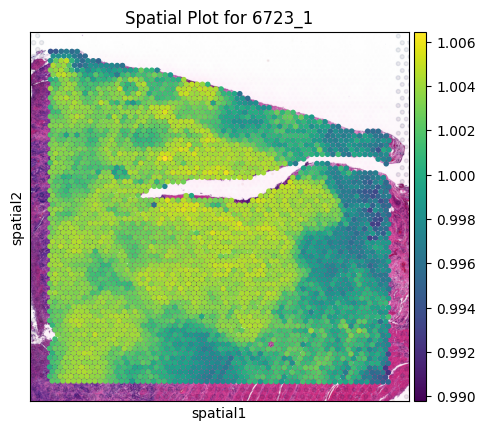

Saved spatial plot for 6723_1 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_cnv_score_6723_1.png


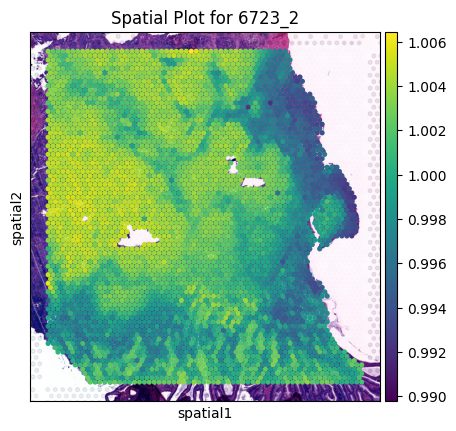

Saved spatial plot for 6723_2 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_cnv_score_6723_2.png


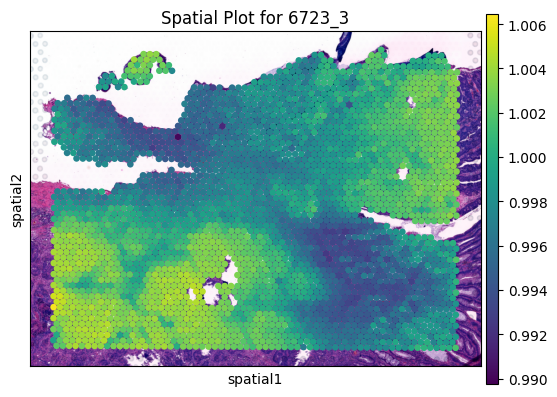

Saved spatial plot for 6723_3 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_cnv_score_6723_3.png


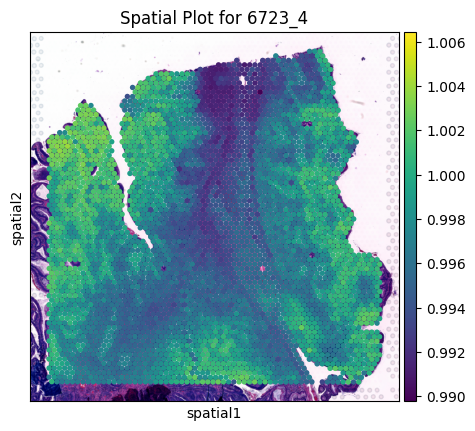

Saved spatial plot for 6723_4 to /export/home/zhangyujia/Datasets/spatial_transcriptome/CRC_ST/PAT71397/merged_output/spatial_cnv_score_6723_4.png


In [50]:
### copy_number
adata.obsm['copy_number'] = copy_number_profile.cpu().numpy()
adata.obs['copy_number'] = copy_number_profile.cpu().numpy().mean(axis=1)

global_min = adata.obs['copy_number'].min()
global_max = adata.obs['copy_number'].max()

for library_id in adata.uns['spatial'].keys():
    adata_subset = adata[adata.obs['sample_id'] == library_id]

    if adata_subset.n_obs == 0:
        print(f"No data points for library_id: {library_id}")
        continue

    sc.pl.spatial(
        adata_subset,
        img_key='hires',  
        color='copy_number',  
        size=1.6,
        library_id=library_id,
        title=f"Spatial Plot for {library_id}",
        vmin=global_min,  
        vmax=global_max   
    )


    output_file = os.path.join(output_dir, f"spatial_cnv_score_{library_id}.png")
    plt.savefig(output_file, dpi=300, bbox_inches='tight') 
    plt.close()  

    print(f"Saved spatial plot for {library_id} to {output_file}")

Sample 6723_1: Best Resolution = 0.30000000000000004, Best ARI = 0.0987, Best NMI = 0.1465


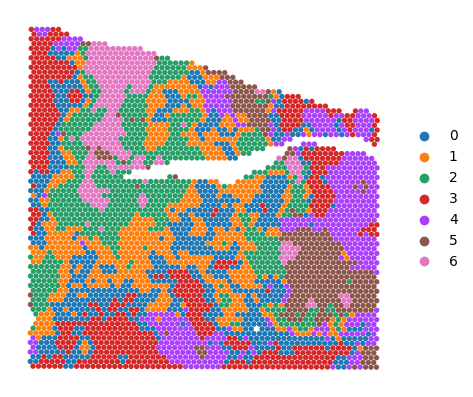

Sample 6723_2: Best Resolution = 0.2, Best ARI = 0.0721, Best NMI = 0.1132


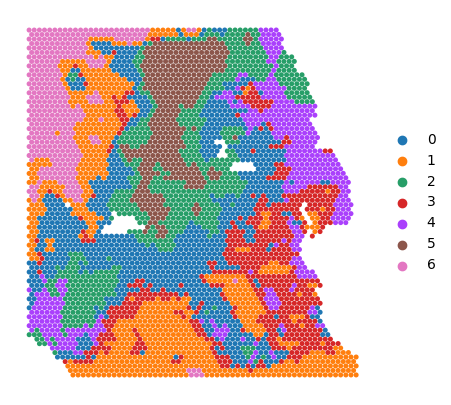

Sample 6723_3: Best Resolution = 0.30000000000000004, Best ARI = 0.0540, Best NMI = 0.0938


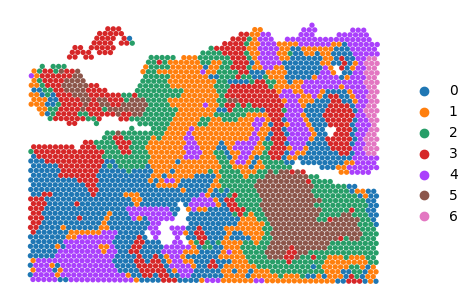

Sample 6723_4: Best Resolution = 0.30000000000000004, Best ARI = 0.0757, Best NMI = 0.1402


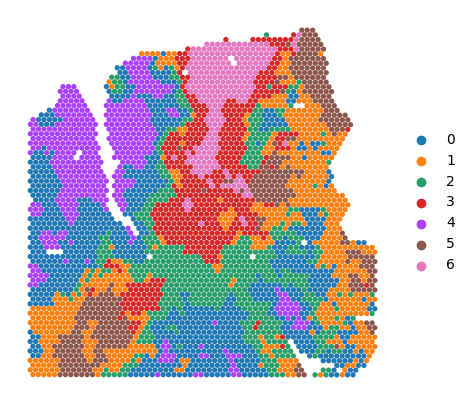


Best Resolutions for Each Sample: {'6723_1': 0.30000000000000004, '6723_2': 0.2, '6723_3': 0.30000000000000004, '6723_4': 0.30000000000000004}
Overall ARI Scores: {'6723_1': 0.09868249569180831, '6723_2': 0.0721137261201781, '6723_3': 0.054022242064055204, '6723_4': 0.07569823047400939}
Overall NMI Scores: {'6723_1': 0.14649310331416368, '6723_2': 0.11322389874984143, '6723_3': 0.09378040339284903, '6723_4': 0.1401742390334349}


In [51]:
import numpy as np
from sklearn import metrics
import scanpy as sc
import matplotlib.pyplot as plt

use_rep = "copy_number"  # 'latent', 'copy_number', 'X_pca'
method = 'leiden'  # 'mclust', 'leiden', 'louvain'
resolutions = np.arange(0.1, 1.1, 0.1)  

samples = adata.obs['sample_id'].unique()  
best_resolutions = {}
overall_ari_scores = {}
overall_nmi_scores = {}

if isinstance(adata.X, torch.Tensor):
    adata.X = adata.X.cpu().numpy()
for key, value in adata.obsm.items():
    if isinstance(value, torch.Tensor):
        adata.obsm[key] = value.cpu().numpy()

for sample in samples:
    subset = adata[adata.obs['sample_id'] == sample]
    best_resolution = None
    best_ari = -1  
    best_nmi = -1  
    metrics_per_res = {}

    for res in resolutions:
        sc.pp.neighbors(subset, use_rep=use_rep, n_neighbors=15, metric="euclidean")
        sc.tl.leiden(subset, resolution=res)

        if 'pathology_annotation' in subset.obs:
            ari = metrics.adjusted_rand_score(subset.obs['leiden'], subset.obs['pathology_annotation'])
            nmi = metrics.normalized_mutual_info_score(subset.obs['leiden'], subset.obs['pathology_annotation'])
            metrics_per_res[res] = {'ARI': ari, 'NMI': nmi}

            if ari > best_ari:
                best_ari = ari
                best_nmi = nmi
                best_resolution = res

    best_resolutions[sample] = best_resolution
    overall_ari_scores[sample] = best_ari
    overall_nmi_scores[sample] = best_nmi
    print(f"Sample {sample}: Best Resolution = {best_resolution}, Best ARI = {best_ari:.4f}, Best NMI = {best_nmi:.4f}")

    if best_resolution is not None:
        sc.pp.neighbors(subset, use_rep=use_rep, n_neighbors=15, metric="euclidean")
        sc.tl.leiden(subset, resolution=best_resolution)

        fig, ax = plt.subplots(figsize=(5, 5))
        sc.pl.spatial(
            subset,
            img_key=None, 
            color="leiden",  
            library_id=sample,  
            size=1.5,
            title="",
            ax=ax,  
            show=False  
        )
        ax.axis('off')  
        plt.show()  

print("\nBest Resolutions for Each Sample:", best_resolutions)
print("Overall ARI Scores:", overall_ari_scores)
print("Overall NMI Scores:", overall_nmi_scores)

In [ ]:
### PCA
pca = PCA(svd_solver='arpack')  
copy_number = adata.obsm['copy_number']
X_pca = pca.fit_transform(copy_number)
adata.obsm['X_pca'] = X_pca

... storing 'domain' as categorical
... storing 'domain' as categorical
... storing 'domain' as categorical
... storing 'domain' as categorical


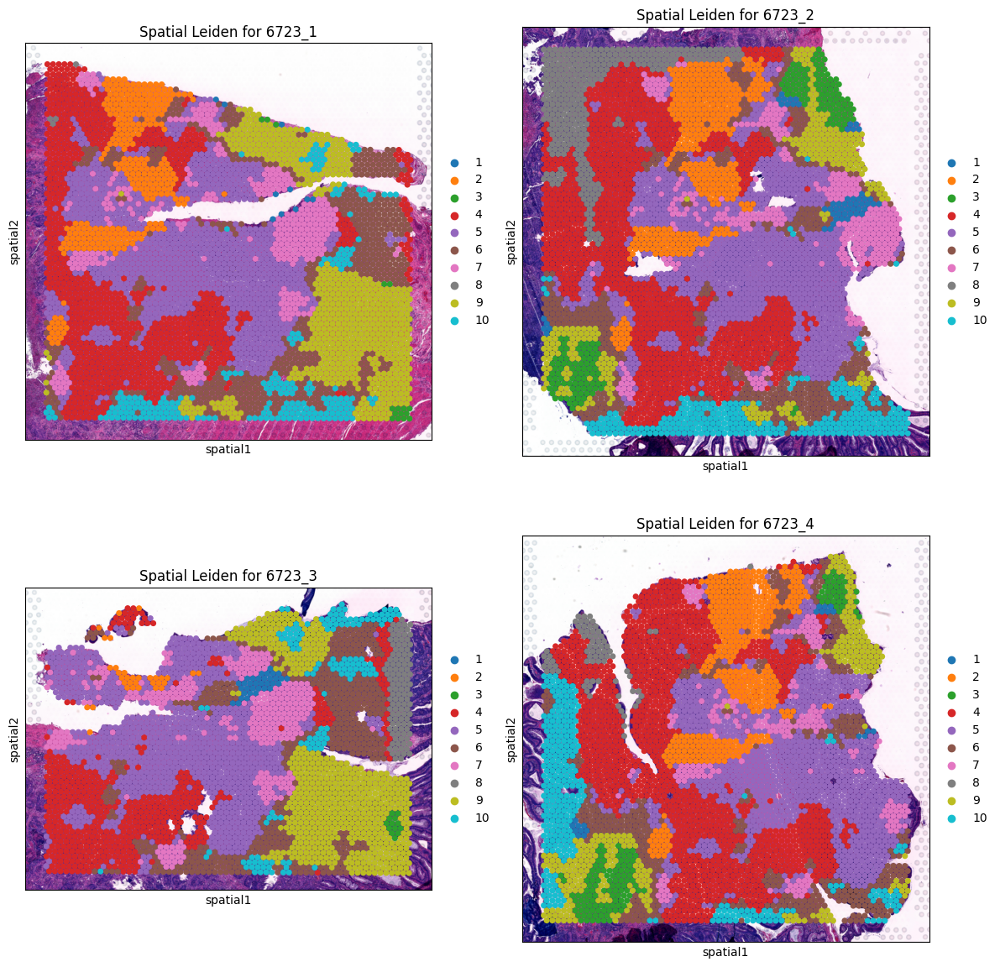

In [13]:
library_ids = list(adata.uns['spatial'].keys())

n_cols = 2
n_rows = (len(library_ids) + 1) // n_cols  
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 6))

axes = axes.flatten()

for idx, library_id in enumerate(library_ids):
    adata_subset = adata[adata.obs['sample_id'] == library_id].copy()

    sc.pl.spatial(
        adata_subset,
        img_key='hires',
        color='mclust',
        size=1.6,
        library_id=library_id,
        title=f"Spatial Leiden for {library_id}",
        ax=axes[idx],
        show=False
    )

for i in range(len(library_ids), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()

#### Step8: Downstream analysis

In [11]:
use_rep = "copy_number"  # 'latent', 'copy_number', 'X_pca'
method='leiden' # 'mclust', 'leiden, 'louvain'
#sc.pp.neighbors(adata, use_rep=use_rep, n_neighbors=15, metric="euclidean")

# Leiden
# sc.tl.leiden(adata, resolution=0.2)
adata = clustering(
    adata,
    method=method,
    auto_choose=False, 
    n_clusters=14, 
    refinement=False,
    use_rep=use_rep
)

Searching for the optimal resolution...


/export/home/zhangyujia/anaconda3/envs/scoiget/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Cluster count: 106, adjusting down
Cluster count: 105, adjusting down
Cluster count: 102, adjusting down
Cluster count: 101, adjusting down
Cluster count: 102, adjusting down
Cluster count: 101, adjusting down
Cluster count: 98, adjusting down
Cluster count: 96, adjusting down
Cluster count: 93, adjusting down
Cluster count: 91, adjusting down
Cluster count: 92, adjusting down
Cluster count: 90, adjusting down
Cluster count: 88, adjusting down
Cluster count: 87, adjusting down
Cluster count: 89, adjusting down
Cluster count: 83, adjusting down
Cluster count: 86, adjusting down
Cluster count: 84, adjusting down
Cluster count: 79, adjusting down
Cluster count: 80, adjusting down
Cluster count: 71, adjusting down
Cluster count: 69, adjusting down
Cluster count: 72, adjusting down
Cluster count: 70, adjusting down
Cluster count: 66, adjusting down
Cluster count: 64, adjusting down
Cluster count: 57, adjusting down
Cluster count: 62, adjusting down
Cluster count: 56, adjusting down
Cluster 

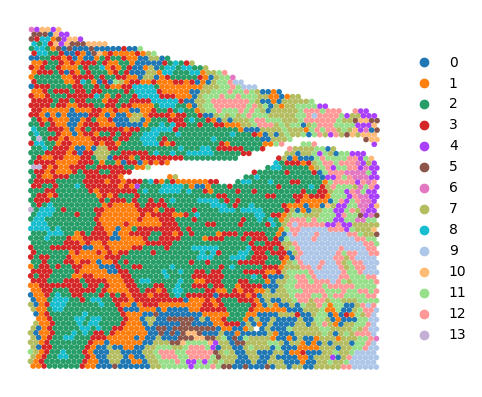

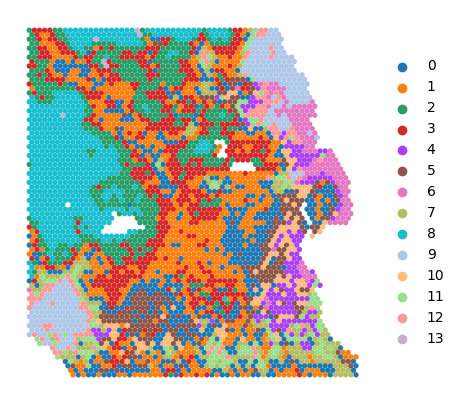

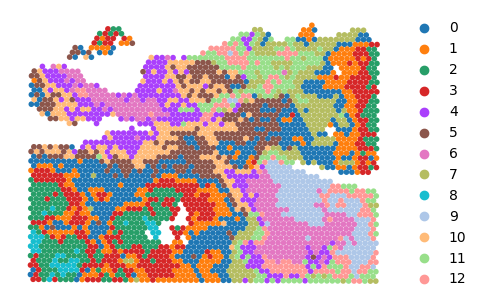

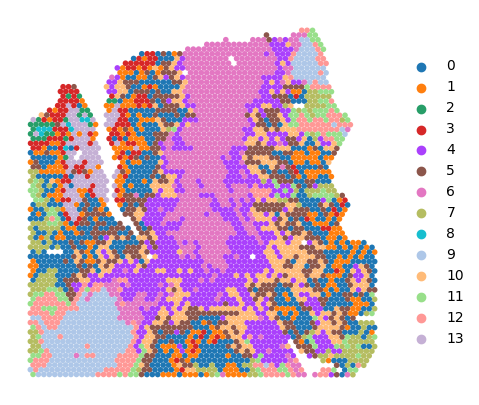

In [8]:
library_ids = list(adata.uns['spatial'].keys())

for idx, library_id in enumerate(library_ids):
    adata_subset = adata[adata.obs['sample_id'] == library_id].copy()

    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.spatial(
        adata_subset,
        img_key=None,
        color='leiden',
        size=1.6,
        library_id=library_id,
        title="",
        ax=ax,
        show=False
    )
    ax.axis('off')  
    plt.show()  

... storing 'leiden_merged' as categorical


Original leiden labels for library 6723_1: ['7', '3', '0', '12', '2', ..., '11', '9', '4', '6', '13']
Length: 14
Categories (14, object): ['0', '1', '2', '3', ..., '10', '11', '12', '13']
New leiden_merged labels for library 6723_1: ['adenoma' 'tumor' 'border' 'benign']
Adjusted Rand Index (ARI) for library 6723_1: 0.40444259214698425


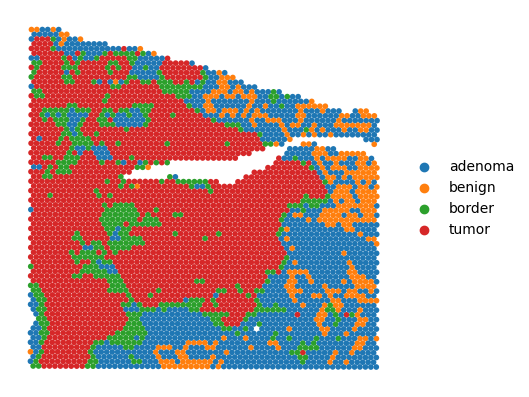

... storing 'leiden_merged' as categorical


Original leiden labels for library 6723_2: ['1', '2', '0', '6', '4', ..., '7', '10', '5', '12', '13']
Length: 14
Categories (14, object): ['0', '1', '2', '3', ..., '10', '11', '12', '13']
New leiden_merged labels for library 6723_2: ['border' 'tumor' 'adenoma' 'benign']
Adjusted Rand Index (ARI) for library 6723_2: 0.14213479368272605


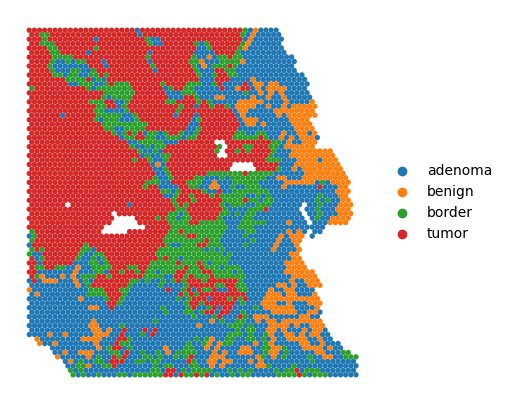

... storing 'leiden_merged' as categorical


Original leiden labels for library 6723_3: ['11', '2', '4', '3', '1', ..., '6', '5', '10', '9', '12']
Length: 13
Categories (13, object): ['0', '1', '2', '3', ..., '9', '10', '11', '12']
New leiden_merged labels for library 6723_3: ['benign' 'tumor' 'border' 'adenoma']
Adjusted Rand Index (ARI) for library 6723_3: 0.020195777648861993


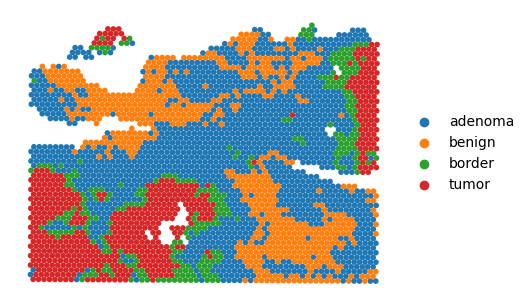

... storing 'leiden_merged' as categorical


Original leiden labels for library 6723_4: ['4', '11', '7', '6', '9', ..., '0', '12', '5', '13', '8']
Length: 14
Categories (14, object): ['0', '1', '2', '3', ..., '10', '11', '12', '13']
New leiden_merged labels for library 6723_4: ['benign' 'adenoma' 'tumor' 'border']
Adjusted Rand Index (ARI) for library 6723_4: 0.1276446709591435


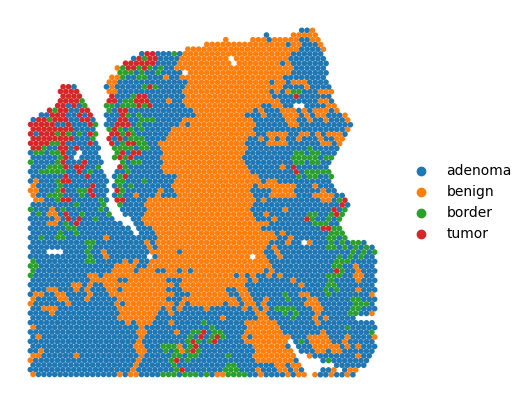

In [14]:
from sklearn.metrics import adjusted_rand_score

cluster_mapping = {
    '2': 'tumor', '3': 'tumor', '8': 'tumor',
    '1': 'border',
    '0': 'adenoma', '5': 'adenoma', '7': 'adenoma', '9': 'adenoma', '10': 'adenoma', '12': 'adenoma', '13': 'adenoma',
    '4': 'benign', '6': 'benign', '11': 'benign'
}

library_ids = list(adata.uns['spatial'].keys())

for idx, library_id in enumerate(library_ids):
    adata_subset = adata[adata.obs['sample_id'] == library_id].copy()

    print(f"Original leiden labels for library {library_id}: {adata_subset.obs['leiden'].unique()}")

    adata_subset.obs['leiden_merged'] = adata_subset.obs['leiden'].apply(
        lambda x: cluster_mapping.get(x, str(x))  
    )

    print(f"New leiden_merged labels for library {library_id}: {adata_subset.obs['leiden_merged'].unique()}")

    if 'pathology_annotation' in adata_subset.obs:
        leiden_merged_labels = adata_subset.obs['leiden_merged']
        pathology_annotation_labels = adata_subset.obs['pathology_annotation']
        
        ari = adjusted_rand_score(leiden_merged_labels, pathology_annotation_labels)
        print(f"Adjusted Rand Index (ARI) for library {library_id}: {ari}")
    else:
        print(f"Pathology annotation not found for library {library_id}")

    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.spatial(
        adata_subset,
        img_key=None,
        color='leiden_merged',
        size=1.6,
        library_id=library_id,
        title="",
        ax=ax,
        show=False
    )
    ax.axis('off')  
    plt.show()  

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import numpy as np

sc_values = {}

for library_id in adata.uns['spatial'].keys():
    adata_subset = adata[adata.obs['sample_id'] == library_id]
    
    sc_value = silhouette_score(
        adata_subset.obsm['copy_number'], adata_subset.obs['leiden']
    )
    sc_values[library_id] = sc_value
    print(f"Silhouette Score for {library_id}: {sc_value:.4f}")

Silhouette Score for 6723_1: 0.3052
Silhouette Score for 6723_2: 0.2939
Silhouette Score for 6723_3: 0.3199
Silhouette Score for 6723_4: 0.3327


... storing 'combined_group' as categorical


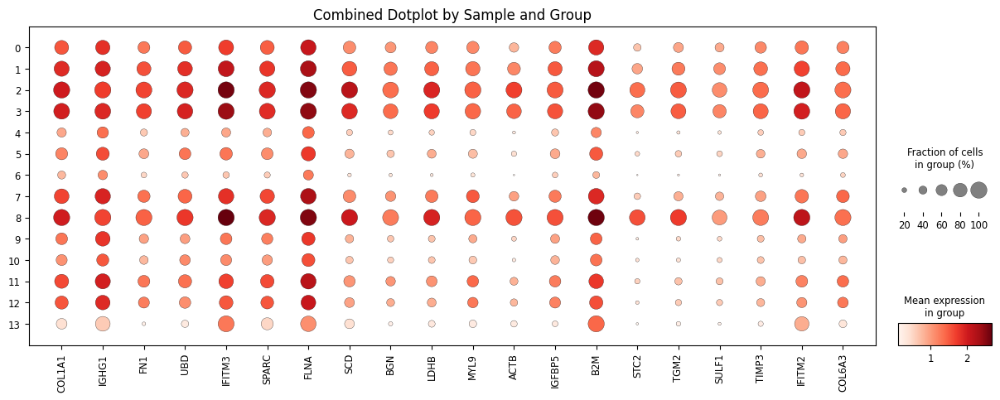

Dotplot saved to output_dir/domain_dotplot.png


In [44]:
adata.obs['group'] = adata.obs['group'].astype('category')

sc.tl.rank_genes_groups(adata, 'group', method='t-test')

deg_df = sc.get.rank_genes_groups_df(adata, group=None)

top_genes = deg_df['names'].unique()[:20]

adata.obs['combined_group'] = adata.obs['sample_id'].astype(str) + "_" + adata.obs['group'].astype(str)

num_groups = len(adata.obs['combined_group'].unique())

dotplot = sc.pl.dotplot(
    adata,
    var_names=top_genes,
    groupby='domain', 
    title='Combined Dotplot by Sample and Group',
    figsize=(15, 5) 
)

output_file = os.path.join("output_dir", "domain_dotplot.png")  
plt.savefig(output_file, dpi=300, bbox_inches='tight')  
plt.close()

print(f"Dotplot saved to {output_file}")

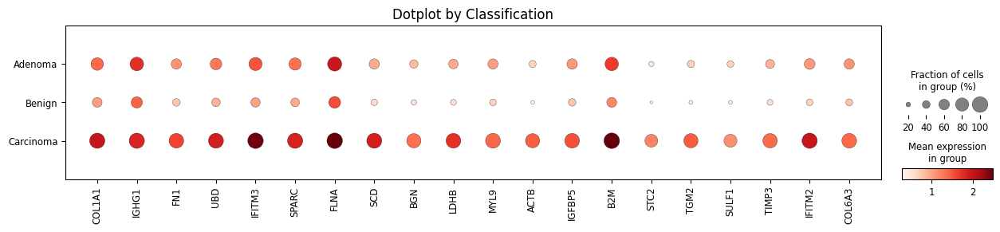

Dotplot saved to output_dir/classification_dotplot.png


In [58]:
sc.tl.rank_genes_groups(adata, 'group', method='t-test')
deg_df = sc.get.rank_genes_groups_df(adata, group=None)
top_genes = deg_df['names'].unique()[:20]

categories = {
    "Carcinoma": [1, 2, 3, 8],
    "Adenoma": [0,5,7,9,10,12,13],
    "Benign": [4,6,11]
}
adata.obs['domain'] = adata.obs['leiden'].astype('category')

def map_to_category(domain):
    for category, domains in categories.items():
        if int(domain) in domains:
            return category
    return "Unknown"

adata.obs['classification'] = adata.obs['domain'].apply(map_to_category).astype('category')

dotplot = sc.pl.dotplot(
    adata,
    var_names=top_genes,  
    groupby='classification',  
    title='Dotplot by Classification',
    figsize=(15, 2.5)
)

output_file = os.path.join("output_dir", "classification_dotplot.png")
plt.savefig(output_file, dpi=300, bbox_inches='tight')  
plt.close()

print(f"Dotplot saved to {output_file}")

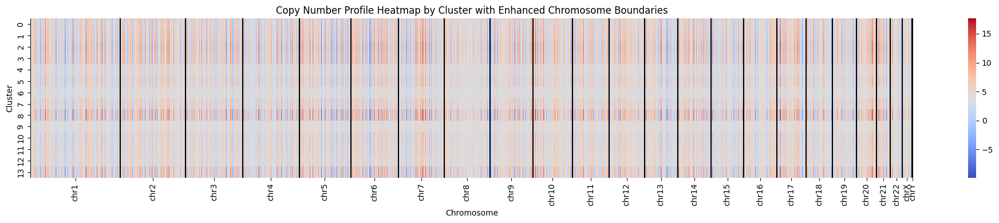

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

copy_number_data = adata.obsm['copy_number']  
leiden_labels = adata.obs['leiden'].astype(int).values  

unique_clusters = np.unique(leiden_labels)
cluster_means = []

for cluster in unique_clusters:
    cluster_data = copy_number_data[leiden_labels == cluster]
    cluster_mean = cluster_data.mean(axis=0)
    cluster_means.append(cluster_mean)

cluster_means = np.vstack(cluster_means)

plt.figure(figsize=(20, 4))
sns.heatmap(cluster_means, cmap="coolwarm", cbar=True)

chrom_list = adata.uns['chrom_list']
chrom_labels = [f'chr{i}' for i in range(1, 23)] + ['chrX', 'chrY']
chrom_positions = [0] + [end for _, end in chrom_list]
chrom_midpoints = [(chrom_positions[i] + chrom_positions[i+1]) // 2 for i in range(len(chrom_positions) - 1)]

plt.xticks(chrom_midpoints, chrom_labels, rotation=90)  
plt.xlabel("Chromosome")
plt.ylabel("Cluster")

for pos in chrom_positions:
    plt.axvline(x=pos, color='black', linestyle='-', linewidth=1.5)  

plt.title("Copy Number Profile Heatmap by Cluster with Enhanced Chromosome Boundaries")
plt.tight_layout()

plt.show()

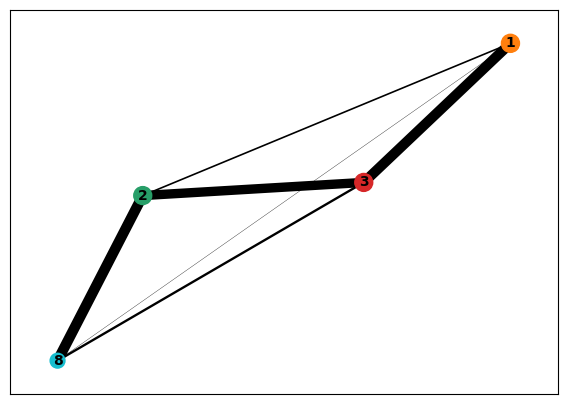

In [69]:
selected_leiden = ['1', '2', '3', '8']  
adata_subset = adata[adata.obs['leiden'].isin(selected_leiden)].copy()

sc.pp.neighbors(adata_subset)

sc.tl.paga(adata_subset, groups='leiden')

sc.pl.paga(adata_subset, threshold=0.03, show=True)

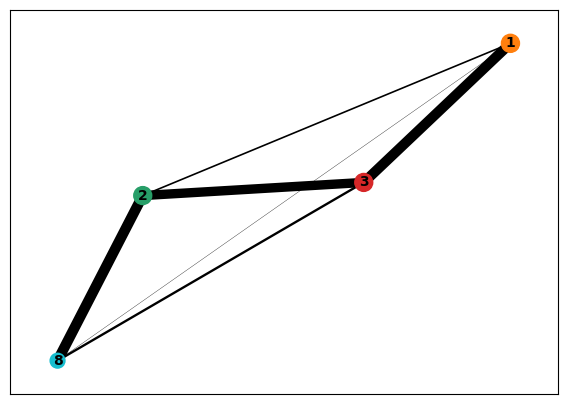

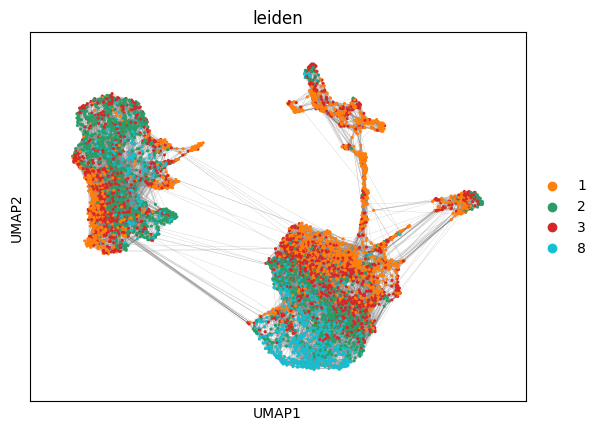

In [70]:
sc.tl.umap(adata_subset)

sc.pl.paga(adata_subset, threshold=0.03, show=True)
sc.pl.umap(adata_subset, color='leiden', edges=True, show=True)

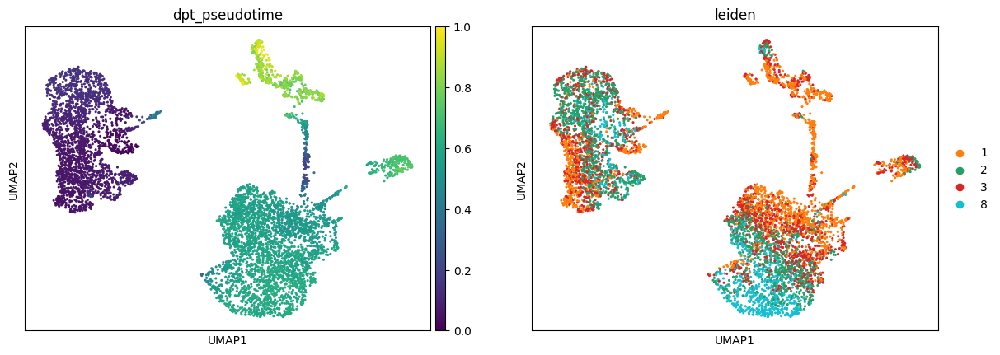

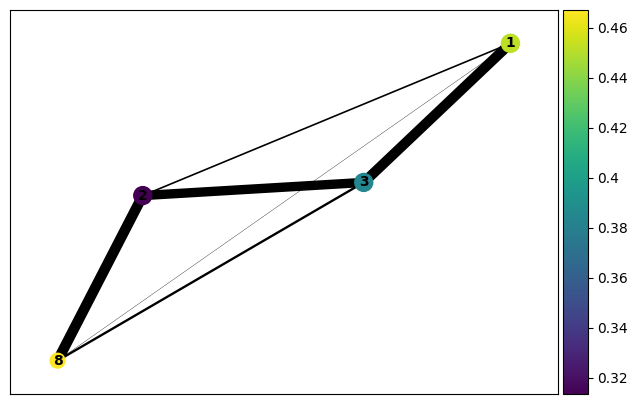

In [71]:
root_clonotype = '1'
adata_subset.uns['iroot'] = np.flatnonzero(adata_subset.obs['leiden'] == root_clonotype)[0]

sc.tl.dpt(adata_subset)

sc.pl.umap(adata_subset, color=['dpt_pseudotime', 'leiden'], show=True)

sc.pl.paga(adata_subset, color='dpt_pseudotime', threshold=0.03, show=True)

In [72]:
import scanpy as sc

clone_mapping = {
    '2': 'cloneA',
    '8': 'cloneB',
    '1': 'cloneC',
    '3': 'cloneD'
}

adata.obs['clone'] = adata.obs['leiden'].map(clone_mapping)

print(adata.obs['clone'].value_counts())

adata_clones = adata[adata.obs['clone'].isin(['cloneA', 'cloneB', 'cloneC', 'cloneD'])].copy()

print(adata_clones.obs['clone'].value_counts())

cloneC    1795
cloneA    1752
cloneD    1750
cloneB     816
Name: clone, dtype: int64
cloneC    1795
cloneA    1752
cloneD    1750
cloneB     816
Name: clone, dtype: int64


... storing 'clone' as categorical


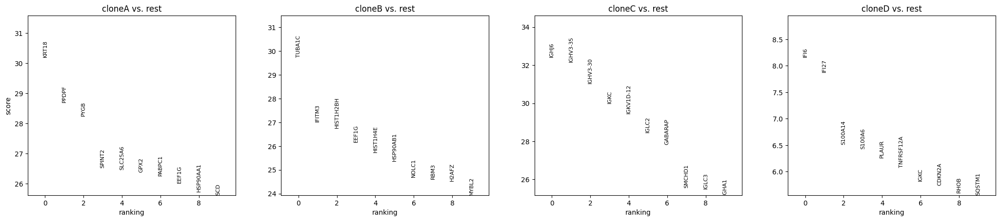

In [73]:
sc.tl.rank_genes_groups(
    adata_clones,
    groupby='clone', 
    method='t-test',  
    key_added='rank_genes_clone'  
)

sc.pl.rank_genes_groups(adata_clones, key='rank_genes_clone', n_genes=10, sharey=False)

In [74]:
result = adata_clones.uns['rank_genes_clone']

clone_names = result['names'].dtype.names

top_genes_per_clone = {
    clone: result['names'][clone][:10].tolist()
    for clone in clone_names
}

for clone, genes in top_genes_per_clone.items():
    print(f"Top 10 genes for {clone}: {genes}")

Top 10 genes for cloneA: ['KRT18', 'PPDPF', 'PYGB', 'SPINT2', 'SLC25A6', 'GPX2', 'PABPC1', 'EEF1G', 'HSP90AA1', 'SCD']
Top 10 genes for cloneB: ['TUBA1C', 'IFITM3', 'HIST1H2BH', 'EEF1G', 'HIST1H4E', 'HSP90AB1', 'NOLC1', 'RBM3', 'H2AFZ', 'MYBL2']
Top 10 genes for cloneC: ['IGHJ6', 'IGHV3-35', 'IGHV3-30', 'IGKC', 'IGKV1D-12', 'IGLC2', 'GABARAP', 'SMCHD1', 'IGLC3', 'IGHA1']
Top 10 genes for cloneD: ['IFI6', 'IFI27', 'S100A14', 'S100A6', 'PLAUR', 'TNFRSF12A', 'IGKC', 'CDKN2A', 'RHOB', 'SQSTM1']


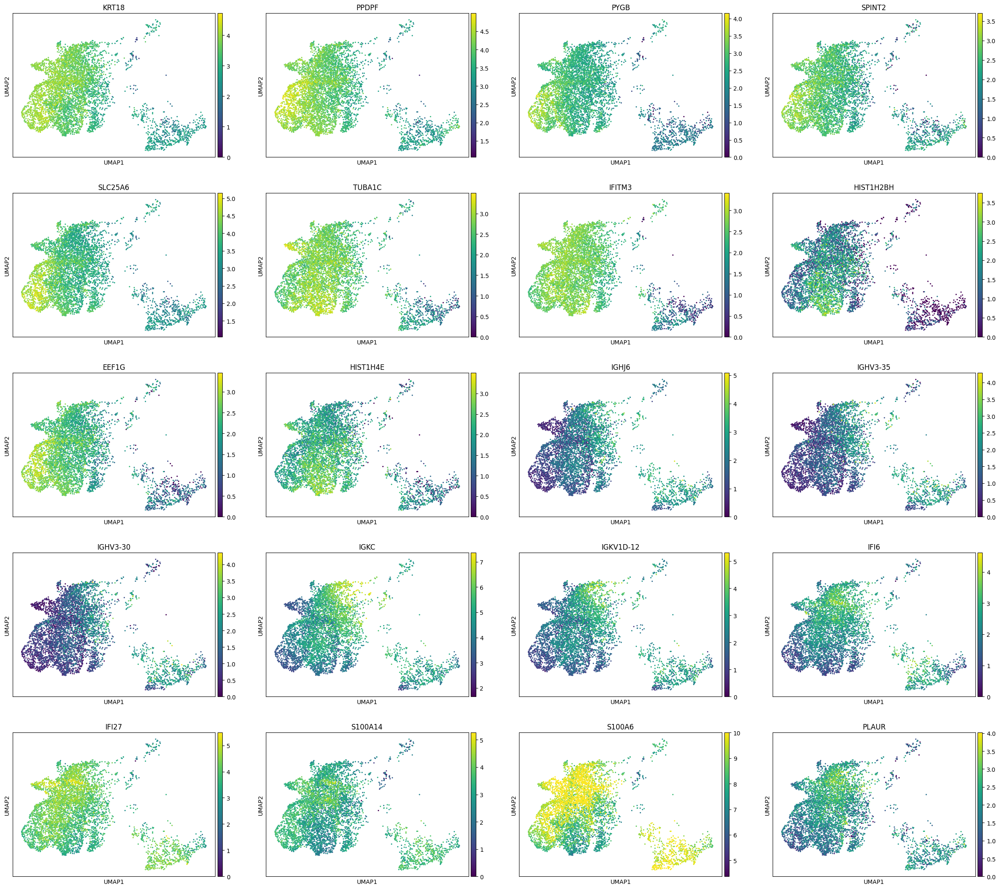

In [75]:
top_genes = [gene for genes in top_genes_per_clone.values() for gene in genes[:5]]

sc.pl.umap(adata_clones, color=top_genes, ncols=4)